## Load libraries

In [1]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline
# %reset out

In [46]:
import os,sys
import re
import math
from datetime import datetime
import time
sys.dont_write_bytecode = True

In [3]:
import pandas as pd
# import geopandas as gpd
import joblib

import numpy as np
import matplotlib.pyplot as plt
import scipy as sp
from skimage.color import rgb2gray
from skimage.transform import resize

from pprint import pprint
from pathlib import Path
from typing import List, Set, Dict, Tuple, Optional, Iterable, Mapping, Union

import pdb

In [4]:
# import holoviews as hv
# from holoviews import opts
# hv.extension('bokeh')

In [5]:
import torch 
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

from torch.utils.data.dataset import Dataset
from torchvision import datasets, transforms
from torch.autograd import Variable

## Helpers

In [6]:
def now2str():
    now = datetime.now()
    now_str = now.strftime("%m_%d_%H:%M:%S")
    return now_str

def info(arr, header=None):
    if header is None:
        header = "="*30
    print(header)
    print("shape: ", arr.shape)
    print("dtype: ", arr.dtype)
    print("min, max: ", min(np.ravel(arr)), max(np.ravel(arr)))

### -- Save trained model

In [7]:
def save_svd_results(U, S_diag, VT, 
                     out_dir: Path, **kwargs) -> Tuple[Path, str]:
    if not out_dir.exists():
        out_dir.mkdir(**kwargs)
    now = datetime.now()
    now_str = now.strftime("%m_%d_%H:%M:%S")
                           
    joblib.dump(U, out_dir/f'U_{now_str}')
    joblib.dump(S_diag, out_dir/f'S_diag_{now_str}')
    joblib.dump(VT, out_dir/f'VT_{now_str}' )
    
    return out_dir, now_str

In [8]:
def load_svd_results(dirpath, time_str):
    U = joblib.load(dirpath/f'U_{time_str}')
    S_diag = joblib.load(dirpath/f'S_diag_{time_str}')
    VT = joblib.load(dirpath/f'VT_{time_str}')

    return U,S_diag,VT

In [9]:
def save_sgd_results(A,B,W, 
                     out_dir: Path, **kwargs) -> Tuple[Path, str]:
    if not out_dir.exists():
        out_dir.mkdir(**kwargs)
    now = datetime.now()
    now_str = now.strftime("%m_%d_%H:%M:%S")
                           
    joblib.dump(A, out_dir/f'A_{now_str}')
    joblib.dump(B, out_dir/f'B_{now_str}')
    joblib.dump(W, out_dir/f'W_{now_str}' )
    
    print(f'Saved trained models to ', out_dir/now_str)
    return out_dir, now_str

In [10]:
def load_sgd_results(dirpath, time_str=None):
    if time_str is not None:
        fn_a = dirpath/f'A_{time_str}'
        fn_b = dirpath/f'B_{time_str}'
        fn_w = dirpath/f'W_{time_str}'
    else: 
        fn_a = dirpath/f'A'
        fn_b = dirpath/f'B'
        fn_w = dirpath/f'W'
    A = joblib.load(dirpath/fn_a)
    B = joblib.load(dirpath/fn_b)
    W = joblib.load(dirpath/fn_w)

    return A,B,W

## Bilinear model to separate the two factors of variation in map tiles from various sources
We consider a collection of map tiles to have two kinds of variations: one that is "content"-related and the other that is "Style"-related.  Our goal is to find/discover the hidden factors each of which governs either the content or the style-related variations in the dataset of maptiles collected from various sources (eg. Satellites, Google Maps, Historic archives, Human graphic designer of a particular artistic style). We frame this goal as a "two factors problem" as tackled in previous works like Tenanbuam2000, and train a bilinear model to our dataset. We choose the "content" variable to correspond to the location identification of each maptile, and the "style" variable to correspond to the source of each map tile.  As a toy example of a bilinear model of map tiles, we train both an asymmetric bilinear model and a symmetric bilinear model. Our training dataset consists of:
- content variable $b^c$: specifies the location id of each data point (ie. a map tile)
    - num. of content classes = num. of unique locations = 15
    - dimensionality of content variable ("$J$" in Tenanbaum2000) is the model hyperparameter
    
- style variable $a^s$: specifies the style of each map tile
    - num. of style classes = num. of unique styles in the (training+testing) dataset = 5
        - TonerBackground, TerrainLines, CartoLight, CartoVoyager, Watercolor
        - All styles are created by StamenMap, while maintaining the same geographic content in each map tile. Since the underlying geographic information ("content") is stylized in various "style"s, this dataset is a good test bed for a bilinear model to evaluate how well the model learns to discover the two separate factors of variations. 
    - We reserve one style during the training, and use the maps in that style to perform "updating during the test phase" (See. Sec4 in Tenanbaum), which involves the three generalization tasks: classification, extrapolation, and translation
    - Dimensionality of style variable ("$I$" in Tenanbaum2000) is the model hyperparameter if the model is a symmetric model. 

Here is the sample dataset:
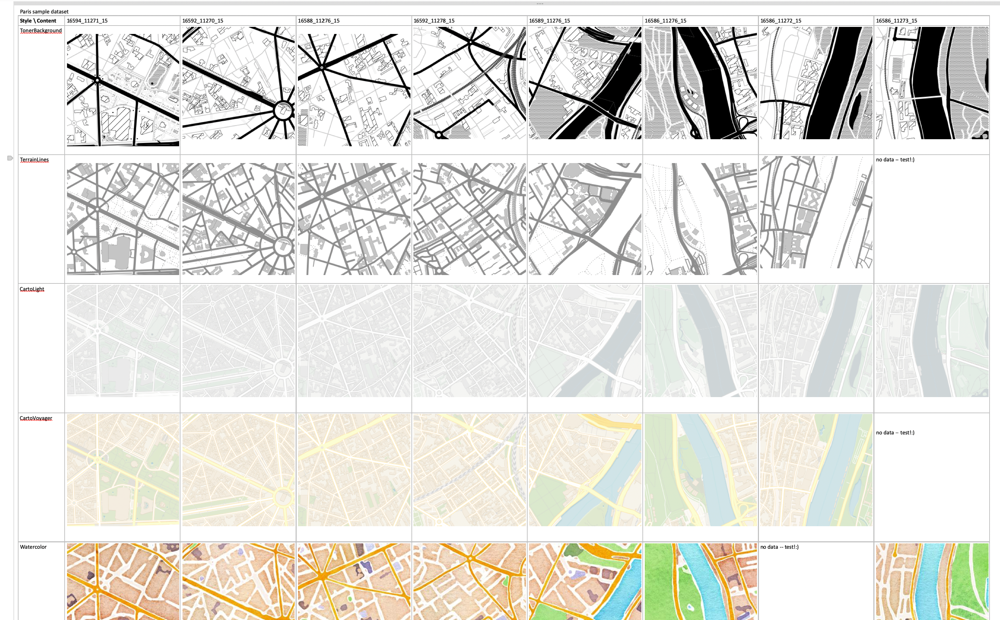

## Data Folder Structure
```
maptile-samples
    |- city
        |- style
            |- zoom
                |- x_y_z.png
```   
- Content variable represents geolocation of the map tiles
- Style variable represents the visual style of the map tiles (eg. satellite, OpenStreetMap, Stamen Watercolor)

## Data type
- Each map tile is 256x256x4 (RGBA) with dtype=float32
    - values are in float32, range [0.0, 1.0]
    - shape:  (256, 256, 4)
    - dtype:  float32
    - min, max:  0.0 1.0

## Prepare data

In [11]:
DATA_ROOT = Path('/data/hayley-old/maptile-samples/')
CITY_DIR = DATA_ROOT/'paris'
!ls {DATA_ROOT/'paris'}
# !tree -l 2 {DATA_ROOT/'paris'}

CartoLightNoLabels    EsriWorldTopo  StamenTerrainLines     StamenWatercolor
CartoVoyagerNoLabels  MtbmapDefault  StamenTonerBackground
EsriImagery	      OSMDefault     StamenTonerLines


In [12]:
# style class label <--> string of style name
style_idx2str = {0:'StamenTonerBackground',
         1:'StamenTerrainLines',
         2:'CartoLightNoLabels',
         3:'CartoVoyagerNoLabels', # <-- test
         4:'StamenWatercolor'
        } #ignore for now
style_str2idx = {style_str:style_idx for style_idx,style_str in style_idx2str.items()}
 #0,1,2 style classes are used for training

In [13]:
cities = ['paris'] #, 'london', 'la']

### Specify styles for training dataset

In [14]:
styles = [style_idx2str[i] for i in [0,2,4]]
style2idx = {s:i for (i,s) in enumerate(styles)}
# styles = list(style_idx2str.values())
n_styles = len(styles)
cities, styles

(['paris'],
 ['StamenTonerBackground', 'CartoLightNoLabels', 'StamenWatercolor'])

### Specify contents for training dataset
For specified (training) styles, we include locations (x_y_z) that have data points (ie. map tiles) collected for all training styles.

In [15]:
contents = []
content_fns = []
for city in ['paris']: #cities:
    city_dir = DATA_ROOT/city
    city_locs = set()
    
    for style in styles:
        style_dir = city_dir/style/'15'
        locs = [] 
        for fn in style_dir.iterdir():
            if fn.suffix == '.png':
                locs.append(fn.stem)
        
        # update city_locs to contain only the overlapping locations
        if len(city_locs) == 0:
            city_locs = set(locs)
            print('=== city: ', city)
            print("\tstyle: ", style)
            print(len(city_locs))
            
        else:
            print('\n\tUpdating: ', style)
            print('Cand. locs: ', len(locs))
            city_locs = city_locs.intersection(set(locs))
            print('Overlapping locs so far: ', len(city_locs))
#             pdb.set_trace()
    contents.extend(list(city_locs)) #in-place
    content_fns.extend([city_dir/style/fn for style in styles for fn in list(city_locs)])

=== city:  paris
	style:  StamenTonerBackground
13

	Updating:  CartoLightNoLabels
Cand. locs:  13
Overlapping locs so far:  13

	Updating:  StamenWatercolor
Cand. locs:  9
Overlapping locs so far:  9


In [16]:
assert len(content_fns) == len(styles)*len(contents)
contents

['16586_11276_15',
 '16594_11271_15',
 '16586_11273_15',
 '16589_11276_15',
 '16592_11278_15',
 '16588_11277_15',
 '16588_11276_15',
 '16589_11275_15',
 '16592_11270_15']

In [17]:
content_idx2str = {i:loc_name for i,loc_name in enumerate(contents)}
content_str2idx = {loc_name:i for i,loc_name in enumerate(contents)}
n_contents = len(contents)

### Create a dataframe for filenames to maptiles organized into (style, content)

In [18]:
df_data = pd.DataFrame(columns=['fn', 'style', 'content'])

# Visualize the training dataset 
# 12 content classes
# 3 style classes
# GRAYSCALE = True
# TARGET_SIZE = (64,64)

GRAYSCALE = False
TARGET_SIZE = (64,64,3)
FIGSIZE_FACTOR = 5

def make_df_data(contents: Iterable[str], styles: Iterable[str],
             grayscale, target_size, figsize_factor=5) -> pd.DataFrame:
    #todo: add to_show
    df_data = pd.DataFrame(columns=['fn', 'style', 'content'])

    nrows, ncols = len(styles), len(contents)
    f, ax = plt.subplots(nrows=nrows, ncols=ncols,
                        figsize=(FIGSIZE_FACTOR*ncols, FIGSIZE_FACTOR*nrows))
    for j, c_str in enumerate(contents):
        for i, style in enumerate(styles):
            fn = CITY_DIR/style/'15'/f'{c_str}.png'

            # Collect parsed image metadata
            df_data = df_data.append({'fn':fn, 'style': style, 'content':c_str},
                                    ignore_index=True)
            try:
                img = plt.imread(fn)
            except SyntaxError:
                img = plt.imread(fn, format='jpg')
            if img.ndim == 3 and img.shape[-1] == 4:
                img = img[:,:,:3] #drop the alpha channel
            if target_size is not None:
                img = resize(img, target_size, anti_aliasing=True) # applies blurring with Gaussian kernel
            if grayscale:
                    img = rgb2gray(img)

            ax[i][j].imshow(img, cmap='gray' if grayscale else None)
            ax[i][j].set_title(c_str)
            ax[i][j].set_axis_off()
    return df_data


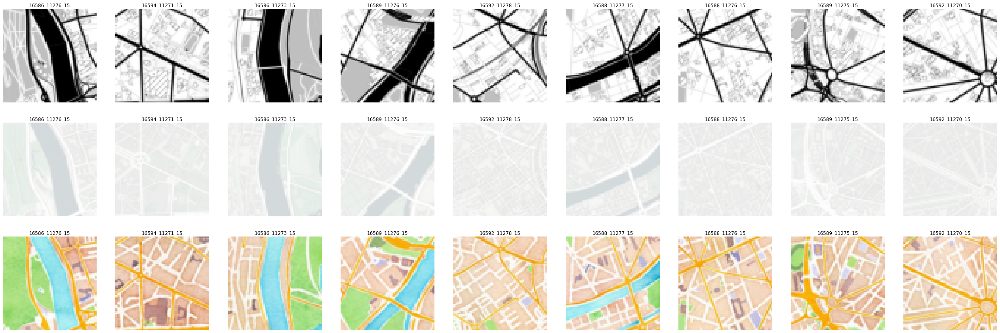

In [19]:
df_data = make_df_data(contents, styles, grayscale=GRAYSCALE, target_size=TARGET_SIZE)
assert len(df_data) == n_styles * n_contents

In [20]:
def get_dict_of_maps(
    df_data: pd.DataFrame,
    grayscale: bool,
    target_size: Tuple[int, int]
) -> Mapping[Tuple[int,int], np.ndarray]:
    """
    Args:
    - df_data (pd.DataFrame): a dataframe with columns=['fn', 'style','content'], and all values 
        are string objects.
        - eg. df_data.iloc[0,:] = ['16594_11271_15', 'StamenTonerBackground', '16594_11271_15']
    
    Returns:
    - imgs (Dict[style][content]): a dictionary whose key is a tuple of (style_idx, content_idx) 
        and value is a np.ndarray for the image 
    """
    imgs = {}
    for i,row in df_data.iterrows():
        try:
            img = plt.imread(row.fn)
        except SyntaxError:
            img = plt.imread(row.fn, format='jpg')
        if img.ndim == 3 and img.shape[-1] == 4:
            img = img[:,:,:3] #drop the alpha channel
        
        if target_size is not None:
            img = resize(img, target_size, anti_aliasing=True) # applies blurring with Gaussian kernel
        if grayscale:
            img = rgb2gray(img)
        s = style2idx[row.style]
        c = content_str2idx[row.content] 
        imgs[(s,c)] = img
        
#         info(img)
#         plt.imshow(img, cmap='gray')
#         plt.show()
#         pdb.set_trace()
    return imgs

In [21]:
df_data.head()

,fn,style,content
0,/data/hayley-old/maptile-samples/paris/StamenT...,StamenTonerBackground,16586_11276_15
1,/data/hayley-old/maptile-samples/paris/CartoLi...,CartoLightNoLabels,16586_11276_15
2,/data/hayley-old/maptile-samples/paris/StamenW...,StamenWatercolor,16586_11276_15
3,/data/hayley-old/maptile-samples/paris/StamenT...,StamenTonerBackground,16594_11271_15
4,/data/hayley-old/maptile-samples/paris/CartoLi...,CartoLightNoLabels,16594_11271_15


In [22]:
imgs = get_dict_of_maps(df_data, GRAYSCALE, TARGET_SIZE)
assert len(imgs) == n_styles * n_contents

In [23]:
list(imgs.keys())[:2]


[(0, 0), (1, 0)]

### Create data matrix X


In [24]:
DTYPE = np.float32
x_dim = np.prod(TARGET_SIZE)

print('=== Training Dataset ===')
print('num styles: ', n_styles)
print('num content classes: ', n_contents)
print('dim of data var: ', x_dim)

=== Training Dataset ===
num styles:  3
num content classes:  9
dim of data var:  12288


In [25]:
X =  np.zeros((n_styles*x_dim, n_contents), dtype=DTYPE)
for (s,c), img in imgs.items():
    img = img.flatten().astype(DTYPE) # order is row1->row2-> ...
    X[s*x_dim:(s+1)*x_dim, c] = img
print("=== Data matrix ===")
print(f"Shape: {X.shape}")
print("Dtype: ", {X.dtype})

=== Data matrix ===
Shape: (36864, 9)
Dtype:  {dtype('float32')}


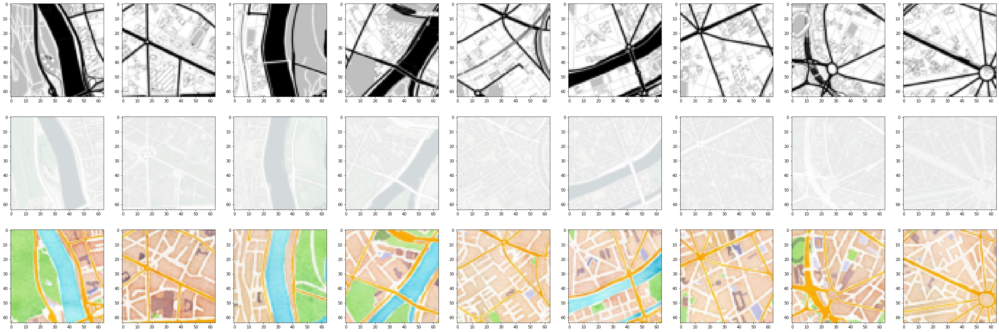

In [26]:
# check if X has placed with images in correct (style, content) categories
nrows = n_styles
ncols = n_contents
f, ax = plt.subplots(nrows, ncols, figsize=(5*ncols, 5*nrows))
for s in range(n_styles):
    for c in range(n_contents):
        img = X[s*x_dim:(s+1)*x_dim, c].reshape(TARGET_SIZE)
        ax[s][c].imshow(img, cmap='gray')
        

In [27]:
X.shape


(36864, 9)

----------------------------------------------------------------------

# Learn a **asymmetric** bilinear model
- Approach 1: use SVD
- Approach 2: use Stochastic Gradient Descent with the initial weights of A to be a tile of an arbitrary eigenbasis from the trained asym. model (trained by SVD via the approach 1)

### Approach 1: Fit (a)symmetric model using SVD

Find X=AB using SVD 
- X: Data matrix of flattened data vars of size (n_style x x_dim) x n_contents
- A: Stacked style parameters of shape (n_style*x_dim) x dim_content
- B: Stacked content parameters of shape dim_content x n_contents

$X = USV^T$
- A: first $J$ columns of US
- B: first $J$ rows of $V^T$
---
- U: SK x SK, where SK = n_style x x_dim
- S: SK x n_content
- V: n_content x n_contents
    

In [29]:
# Fit the asymmetric model
# Note: the SVD is independent of `dim_content (= J)`, which is the model parameter of the asymmetric models.
# -- this means, we don't need to run the SVD everytime we set a different value of J for model comparison.
# -- Solve SVD of X once; and use the decomposition results (U,S,VT) to construct/select the style-specific model 
#    parameters (A) and the learned values for the parameters of the content vectors (B)

t0 = time.time()
U,S_diag,VT = np.linalg.svd(X, full_matrices=False)
time.strftime("%H:%M:%S", time.gmtime(time.time()-t0))

'00:00:00'

In [97]:
# Save SVD on this data matrix X
out_dir = Path(f'./trained/map/asym/svd/img:64-ns:{n_styles}-nc:{n_contents}')

save_svd_results(U, S_diag, VT, 
                     out_dir=out_dir, parents=True)


(PosixPath('trained/map/asym/svd/img:64-ns:3-nc:9'), '11_06_15:49:19')

In [30]:
# Hyperparameter for the asym. models
# dim_content = J 
dim_content = int(n_contents//1.5) #what happens if this the same as the number of distinct content class (ie. number of poses, which is 13)
assert dim_content <= n_contents

img_descr = 'x'.join(map(str, TARGET_SIZE))
model_name = f'map-asym-svd-img:{img_descr}-ns:{n_styles}-nc:{n_contents}-dc:{dim_content}'
print(model_name)

map-asym-svd-img:64x64x3-ns:3-nc:9-dc:6


In [31]:
# S = np.zeros((len(X),n_contents)) # (SK,C) -- When np.linalg.svd is used with 'full_matrices=True'
S = np.zeros((n_contents,n_contents)) # (C,C) -- When svd is used with `full_matrices`=False -- computationally more efficient w/o compromising the accuracy
S[:n_contents, :n_contents] = np.diag(S_diag)

A = np.matmul(U,S)[:,:dim_content] # (SK, dim_content): a set of style-specific eigenbases
B = VT[:dim_content,:] # (dim_content, C)

In [32]:
print("S: ", S.shape)
print("U: ", U.shape)
print("VT: ", VT.shape)

S:  (9, 9)
U:  (36864, 9)
VT:  (9, 9)


In [33]:
print("A: ", A.shape)
print("B: ", B.shape)


A:  (36864, 6)
B:  (6, 9)


In [ ]:
save_svd_results(U, S_diag, VT, 
                     out_dir: Path, ) -> Tuple[Path, str]:

### Analysis (1): Visualize model learned via SVD

#### Show the learned set of style-specific eigenfaces
$A$ is the $(S \times K) \times dim_c (=J)$ matrix, which encodes the learned style-specific eigenfaces.
$B$ is the $dim_c=J \times C$ matrix, each of whose column is a learned content vector 
    - For each content vector, let's see the coordinate distribution

In [37]:
# Map the values of an RGB image to a range
# https://stackoverflow.com/a/55526934
# shape = image.shape
# image_scaled = minmax_scale(image.ravel(), feature_range=(0,255)).reshape(shape)
from sklearn.preprocessing import minmax_scale

In [34]:
def normalize_img(img, vmin=None, vmax=None, *, use_global_range=False):
    if vmin is None:
        vmin = img.min()
    if vmax is None:
        vmax = img.max()
    shape = img.shape
    return minmax_scale(img.ravel(), feature_range=(0,1)).reshape(shape)
    

In [35]:
def visualize_style_specific_eigenbases(A: np.ndarray, 
                                        x_dim: int, 
                                        target_size: Tuple[int],
                                        grayscale: bool) -> plt.Figure:
    """
    Given the asymmetric model's parameter for the style-specific weights for the 
    interactions between the style and the content vectors, visualize the weights 
    as an image (one for each (style, content dimension/component) pair.
    
    Args:
    - A (np.ndarray): 2Dim numpy array of size (n_styles \times x_dim) by dim_content
    - x_dim (int): dimensionality of a flattened data variable x
    
    Returns:
    - plt.Figure: column corresponds to each dimension of a content variable, and the row
    corresponds to a style
    
    """
    SK, dim_content = A.shape
    n_styles = int(SK/x_dim)
    assert np.isclose(SK/n_styles, x_dim)
    
    
    #Plot
    cmap = 'gray'
    if len(target_size) == 3:
        cmap = None

    if grayscale:
        cmap = 'gray'

    vmin, vmax = A.min(), A.max()
    f, ax = plt.subplots(nrows=n_styles, 
                         ncols=dim_content,
                         figsize=(3*dim_content,3*n_styles))
    f.suptitle('Style-specific eigenbasis for content dimension') #style=person_id
    for s in range(n_styles):
        for ic in range(dim_content):
            img = A[s*x_dim:(s+1)*x_dim, ic].reshape(target_size)
            img = normalize_img(img) # project to range [0,1]

            ax[s,ic].imshow(img, cmap=cmap)
            ax[s,ic].set_title(f'$c_{ic}$')
            ax[s,ic].set_axis_off()
    f.tight_layout()
    
    return f

map-asym-svd-img:64x64x3-ns:3-nc:9-dc:6


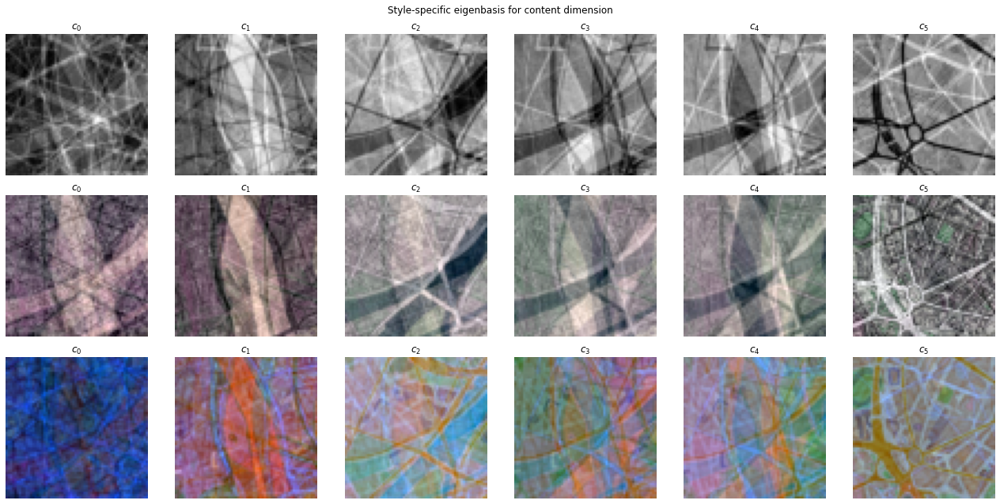

In [38]:
print(model_name)

# #Plot
# cmap = None
# if len(TARGET_SIZE) == 3:
#     cmap = None
# if GRAYSCALE:
#     cmap = 'gray'

# vmin, vmax = A.min(), A.max()
# f, ax = plt.subplots(nrows=n_styles, 
#                      ncols=dim_content,
#                      figsize=(3*dim_content,3*n_styles))
# f.suptitle('Style-specific eigenbasis for content dimension') #style=person_id
# for s in range(n_styles):
#     for ic in range(dim_content):
#         img = A[s*x_dim:(s+1)*x_dim, ic].reshape(TARGET_SIZE)
# #         info(img)
        
#         img = normalize_img(img)
# #         info(img)
# #         pdb.set_trace()
#         ax[s,ic].imshow(img,cmap=cmap)
#         ax[s,ic].set_title(f'$c_{ic}$')
#         ax[s,ic].set_axis_off()
# f.tight_layout()
# plt.show()  
f = visualize_style_specific_eigenbases(A, x_dim=x_dim, target_size=TARGET_SIZE, grayscale=False)
        

In [93]:
# Save figure 
out_dir = Path(f'./results/map/{model_name}')
if not out_dir.exists():
    out_dir.mkdir(parents=True, exist_ok=True)

out_fn = out_dir/'A'
if out_fn.exists():
    out_fn = out_dir/f'A_{now2str()}'
f.savefig(f'./results/map/{model_name}/A')

### Analysis (2): Learned content vectors

#### Visualize the learned set of content classes
$B$ is the $dim_c (=J) \times C$ matrix; each column is a learned content vector for a specific content class (representation)
- For each content vector, let's see the coordinate distribution
- Q: If the model learns a factorized representation of the content variable, each dimension of the content variable will have a specific function in explaining the variations in the content information in the data variables.

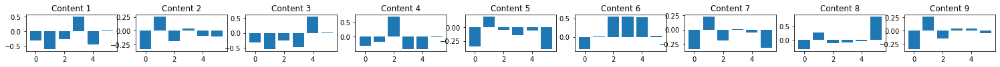

In [39]:
assert B.shape[1] == n_contents

# f, ax = plt.subplots(nrows=2, ncols=math.ceil(n_contents/2))
f, ax = plt.subplots(nrows=1, ncols=n_contents, figsize=(26,1))

ax = ax.flatten()
for i in range(n_contents):
    c = B[:,i]
    ax[i].bar(range(len(c)), c, label=f'Content {i}')
#     ax[i].bar(range(len(c)), c.detach().numpy(), label=f'Content {i}')

    ax[i].set_title(f'Content {i+1}')
# print(i)
# if i<len(ax):
#     # Delete unused axes
#     for j in range(i, len(ax)):
#         f.delaxes(ax[j])
    
# Save figure 
out_dir = Path(f'./results/{model_name}')
if not out_dir.exists():
    out_dir.mkdir(parents=True, exist_ok=True)

out_fn = out_dir/'B' 
if out_fn.exists():
    out_fn = out_dir/f'B_{now2str()}'
f.savefig(f'./results/{model_name}/B')

### Clustering / similarity analysis on the space of learned content vectors
We want to check if the similarity in the space of the learned content variable coincides with the similarity based on human intuition on spatial semantic simialrity. That is, here, we want to check if two content vectors that are closest to each other are manifested into/reconstructed into the images that have the closest spatial semantics (based on human intuitions).

- [ ] Q: what is a good distance metric to compare the sparse vectors like above?
    - Hamming distance: the number of positions at which two vectors have different symbols --> this is not quite what we want. We want the 
    - Cosine: why? 1. because (due to the way SVD works), each content vector has norm 1. (2). the two content vectors are more similar if they use as many as possible eigenbasis (and even more similar if their degrees to which the eignebasis is used are closer)
    
1. Clustering analysis on the content vectors
- KNN
- KDE
- DBSCAN

2. Qualitatively study the content vector pairs and the pair of their re

In [86]:
#1.
from scipy.spatial.distance import cdist

from sklearn.neighbors import KNeighborsClassifier
from sklearn.cluster import KMeans, OPTICS, DBSCAN
from sklearn import metrics

In [90]:
n_clusters = 2
db_eps = 0.01
metric = 'cosine'
min_samples = 3


# knn = KNeighborsClassifier(n_neighbors=min_samples, metric=metric, radius=0.4)
km = KMeans(n_clusters=n_clusters, n_init=1, init='k-means++')
db = DBSCAN(eps=db_eps, min_samples=min_samples, metric=metric)
optics = OPTICS(min_samples=min_samples,metric=metric)


algos = {
#     'knn':knn, 
         'km':km, 
         'dbscan':db, 
         'optics':optics}
for name, algo in algos.items():
    algo.fit(BT)
    print(f'{name}: {algo.labels_}')
    
# to = time.time()
# knn.fit(BT)
# km.fit(B.transpose())
# db.fit(B.transpose())


# km.labels_
# db.labels_

km: [1 0 0 1 0 1 0 0 0]
dbscan: [-1 -1 -1 -1 -1 -1 -1 -1 -1]
optics: [0 0 0 0 0 0 0 0 0]


In [42]:
B.shape

(6, 9)

In [43]:
BT = B.transpose()
metrics = ['cityblock', 'correlation', 'cosine', 'dice', 'euclidean', 'hamming', 'jaccard']


In [44]:
def init_fig(
    nrows:int, 
    ncols:int, 
    figsize:Optional[Tuple[int,int]]=None, 
    figscale: int=5
) -> Tuple[plt.Figure, plt.Axes]:
    
    if figsize is None:
        figsize=(ncols*figscale, nrows*figscale)
    f, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=figsize)
    return f,ax
    

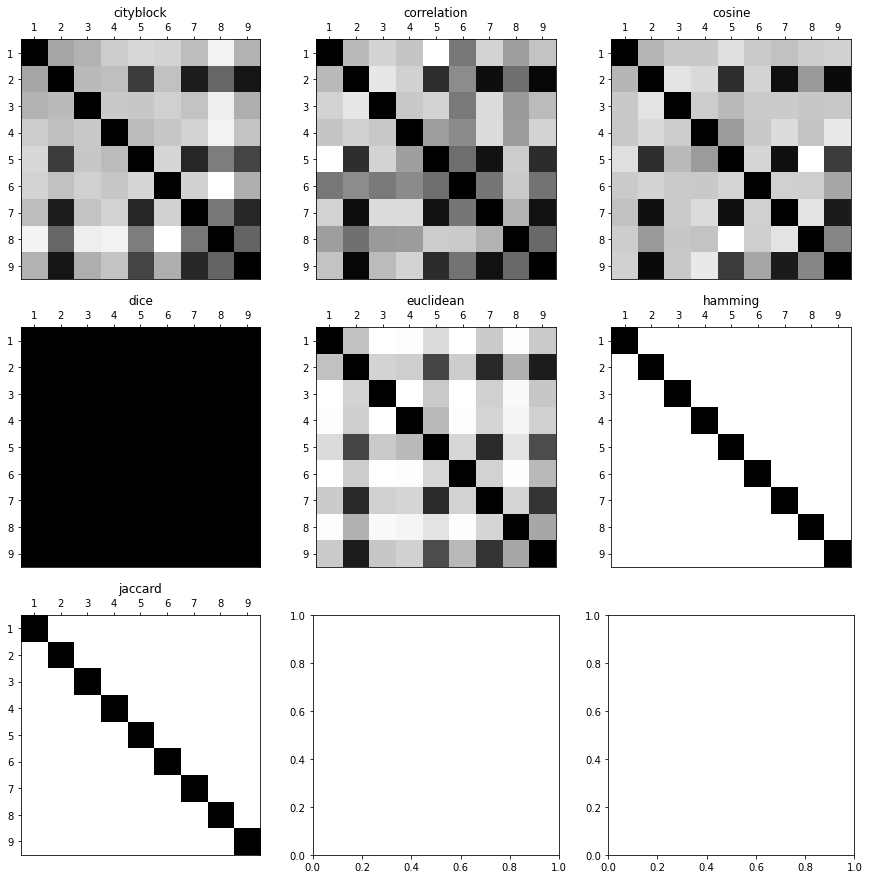

In [78]:
## Visualize pairwise distance
nrows = 3
f,ax = init_fig(nrows=nrows, ncols=math.ceil(len(metrics)/nrows))
ax = ax.flatten()
img_inds = list(map(str, np.arange(1, len(BT)+1)))
for i, metric in enumerate(metrics):
    d = cdist(BT, BT, metric) 
    # Map to [0,1] to make the distance comparison across different metrics meaningful
    d = normalize_img(d, vmin=0, vmax=1)
    ax[i].imshow(d, cmap='gray')
    ax[i].set_title(metric)
    
    ax[i].set_xticks(np.arange(n_contents))
    ax[i].set_xticklabels(img_inds)

    ax[i].xaxis.tick_top()
    
    ax[i].set_yticks(np.arange(n_contents))
    ax[i].set_yticklabels(img_inds)
    


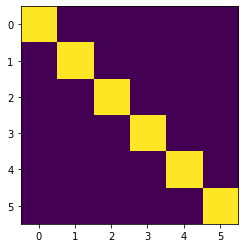

In [80]:
plt.imshow(np.matmul(B,BT))

### Evaluation: by looking at the reconstructed images
- [ ]: MSE over the training dataset

In [100]:
def save_figure(f, out_dir, fname):
    if not out_dir.exists():
        out_dir.mkdir(parents=True, exist_ok=True)
        print(f'{out_dir} is created.')
    
    out_fn = out_dir/fname 
    if out_fn.exists():
        out_fn = out_dir/f'{fname}_{now2str()}'
        
#     pdb.set_trace()
    f.savefig(out_fn)

In [101]:
def visualize_x(X, dim_x, target_size, title=None):
    """
    Args:
    - X (np.array): data matrix of size (num_styles x dim_data_var) x num_contents
    - dim_x (int): dimensionality of a data variable (ie. K in the paper)
    - target_size (tuple): (height,width) of the images
    """
    SK, C = X.shape
    S = int(SK/dim_x)
    n_imgs = S*C
    
    f,ax = plt.subplots(nrows=S, ncols=C, figsize=(3*C,3*S))
    if title is not None:
        f.suptitle(title)
    for i in range(S):
        for j in range(C):
            recon = X[i*dim_x:(i+1)*dim_x, j]
            if S>1:
                ax[i][j].imshow(recon.reshape(target_size), cmap='gray')
            else:
                ax[j].imshow(recon.reshape(target_size), cmap='gray')
            ax[i][j].set_title()
            if i==0 and j==0:
                info(recon)
#                 pdb.set_trace()
    return f,ax
                

In [102]:
X_recon = np.matmul(A,B)



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


shape:  (12288,)
dtype:  float64
min, max:  0.001694679146977037 1.0000000922268246


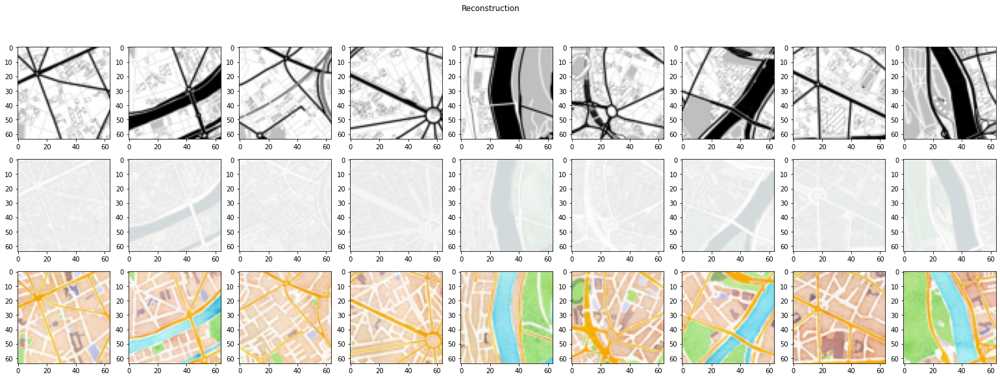

In [103]:
f_recon, _ = visualize_x(X_recon, x_dim, TARGET_SIZE, title='Reconstruction');

In [ ]:
out_dir = Path(f'./results/{model_name}')
save_figure(f_recon, out_dir, 'recon')

In [ ]:
f_input, ax = visualize_x(X, x_dim, TARGET_SIZE, title='input')
save_figure(f_input, out_dir, 'input')

----------------------------------------------------------------------

# Learn a **symmetric** bilinear model


In [104]:
def get_asym_eigenbasis(A: Union[torch.tensor, np.ndarray],
                        s: int,
                        j: int,
                        x_dim: int,
                        reshape: Iterable=None):
    """
    A (torch.tensor or np.ndarray): a set of asymmetric model's style-specific eigenbasis
        - shape: (n_styles * x_dim) * dim_content
        
    s (int): style label; must be in range[0,n_styles)
    cj (int): index of the element in a content vector; must be in range [0, J=dim_content]
    x_dim (int): a data variable's dimensionality; eg. number of pixels
    
    Returns:
    - w_sj (torch.tensor or np.ndarray): dim_style * dim_content matrix that corresponds to 
        the eigenbasis of the style s for the jth content dimension.
    
    """
    w = A[s*x_dim:(s+1)*x_dim, j]
    if reshape is not None:
        return w.reshape(reshape)
    else:
        return w
    
def test_get_asym_eigenbasis(A):
    plt.imshow(get_asym_eigenbasis(A, 0,0,x_dim,TARGET_SIZE),
              cmap='gray')

In [105]:
def plot_2d_arrs(arrs: Iterable, title=None, cmap='gray'):
    f, ax = plt.subplots(1, len(arrs))
    ax = ax.flatten()
    if title is not None:
        f.suptitle(title)
    for i, arr in enumerate(arrs):
        if not isinstance(arr, np.ndarray):
            arr = np.array(arr)
        ax[i].imshow(arr, cmap=cmap)
        minv, maxv = arr.min(), arr.max()
        ax[i].set_title(f'{minv:.3f}, {maxv:.3f}')
        
    f.tight_layout()
    return f

### Approach 2: Use SGD to learn a symmetric model
- hyperparam: dimensionalities I, J of the style variable (a_s) of the content variable (b_c)
- model parameters:
    - the tensor B for all content vectors: (J x C)
    - tenstor A for all style vectors: (I x S)
- Rmb: X is the data matrix that contains one image for each (s,c). 

- Initialize the model parameters (as torch.tensor)
    - Experiment: Use the SVD solution as the initial values of the tensors of model parameters

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


map-sym-sgd-img:64x64x3-ns:3-ds:3-nc:9-dc:9


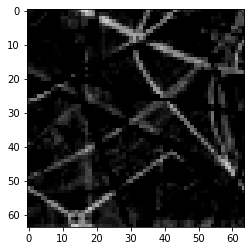

In [123]:

debug = False
dim_style, dim_content = 3,9

# Init method 1
# A = torch.randn((dim_style, n_styles), requires_grad=True)
# B = torch.randn((dim_content, n_contents), requires_grad=True)
# W = torch.randn((x_dim, dim_style, dim_content))

# Init method 2: 
# Load SVD solutions for the asymmetric model above
# and, use as the initial values of (some) model parameters
svd_model_dir = Path(f'./trained/map/asym/svd/img:64-ns:{n_styles}-nc:{n_contents}')
time_str = '11_06_15:49:19'
U,S_diag,VT = load_svd_results(svd_model_dir, time_str)
# S = np.zeros((len(X),n_contents), dtype=DTYPE) 
S = np.zeros((n_contents,n_contents)) # (C,C) -- When svd is used with `full_matrices`=False -- computationally more efficient w/o compromising the accuracy
S[:n_contents, :n_contents] = np.diag(S_diag)

A = np.matmul(U,S)[:,:dim_content] # Use it as the initialization of W for symmetric model
s, j = 0, -1
w_init = get_asym_eigenbasis(A, s=s, j=j, x_dim=x_dim, reshape=(x_dim,1,1)).astype(DTYPE)
B = VT[:dim_content,:]

# Show the w_init
plt.imshow(w_init.reshape(TARGET_SIZE), cmap='gray')

# A,B,W for the sym. model parameters that will be optimized with SGD
# --delete big matrices that have done their duties
# del A, B
W = np.tile(w_init, (1, dim_style, dim_content)) # W.shape == (x_dim, dim_style, dim_content)
W = torch.from_numpy(W).requires_grad_(True)
A = torch.randn((dim_style, n_styles), requires_grad=True) # A.shape == (dim_style, n_styles)
B = torch.from_numpy(B).requires_grad_(True) # B.shape == (dim_content, n_contents)

if isinstance(X, np.ndarray):
    X = torch.from_numpy(X)

# Rename model name for symmetric model via SGD
# Recall naming convention for asym via SVD models: 
# model_name = f'map-asym-svd-img:{img_descr}-ns:{n_styles}-nc:{n_contents}-dc:{dim_content}'


model_name = f'map-sym-sgd-img:{img_descr}-ns:{n_styles}-ds:{dim_style}-nc:{n_contents}-dc:{dim_content}'
model_dir = Path(f'./trained/map/sym/sgd/{model_name}')
model_dir.mkdir(exist_ok=True, parents=True)
print(model_name)

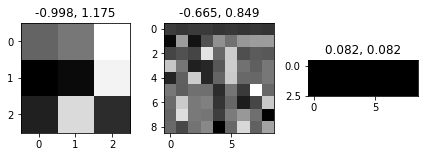

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


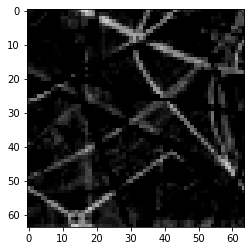

In [124]:
# Visualize initial parameters in A, B, W[0]
arrs = [A.detach().numpy(), B.detach().numpy(), W[0].detach().numpy()] 
plot_2d_arrs(arrs);
plt.show()

plt.imshow(W[:,0,0].detach().numpy().reshape(TARGET_SIZE), cmap='gray')
plt.show()

### Train

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


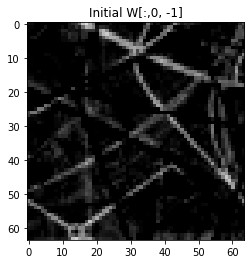

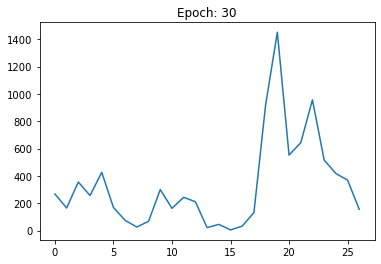

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


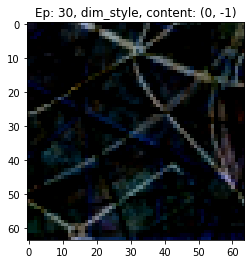

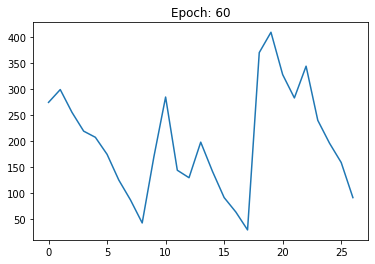

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


W prev vs current:  False


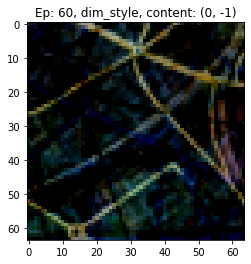

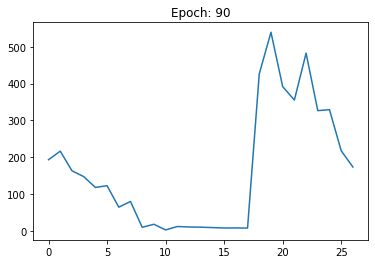

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


W prev vs current:  False


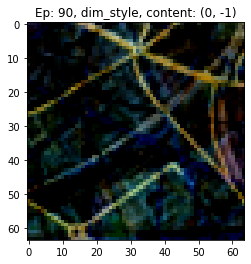

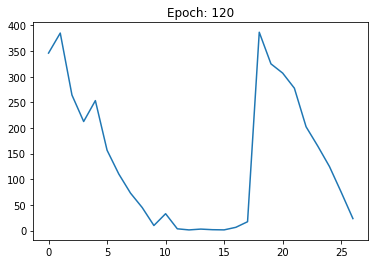

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


W prev vs current:  False


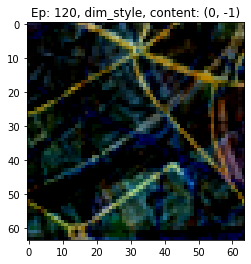

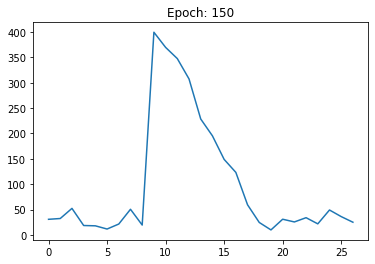

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


W prev vs current:  False


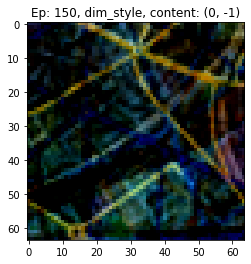

'00:00:13'

In [125]:
# Learning hyperparams
loss_fn = torch.nn.MSELoss(reduction='sum')
learn_rate = 1e-2
optimizer = optim.Adam([A,B,W], lr=learn_rate)
n_epoches = 150
print_every = 30

# Debug setup
debug = True
show_i, show_j = 0,-1
if debug:
    plt.imshow(W[:,show_i,show_j].detach().numpy().reshape(TARGET_SIZE), cmap='gray')
    plt.title(f'Initial W[:,{show_i}, {show_j}]')
    plt.show()
          
W_prev = None
t0 = time.time()
# Mini-batch size = 1
losses = []
for ep in range(n_epoches):
    if len(losses) > 0 and (ep+1)%print_every == 0:
#         plt.plot(losses)
        plt.plot(losses[-(n_styles*n_contents):])
        plt.title(f'Epoch: {ep+1}')
        plt.show()
        
    # One epoch
    for s in range(n_styles):
        for c in range(n_contents):
            # select c and s vectors
            a = A[:,s]
            b = B[:,c]
            Wb = W@b[..., np.newaxis]
            x_hat = torch.matmul(a,Wb).flatten()
            loss = loss_fn(x_hat, X[s*x_dim:(s+1)*x_dim, c])

            # backprop
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            losses.append(loss.item())

            # check if gradient doesn't go wacky
            if torch.isnan(A.grad).any() or torch.isnan(B.grad).any():
                print(s,c)
                pdb.set_trace()

            # visualize the changes in the parameters or .grad's magniture for each model parameter tensor
            if False:
#             if debug:
#                 print(Wb.shape)
#                 print(x_hat.shape)
                print(loss.item())
    #             print(A.grad.shape, B.grad.shape)
                print(f"A.grad: {torch.norm(A.grad).item()}, B.grad: {torch.norm(B.grad).item()}")
                
                # Visualize parameters in A, B, W[0]
                arrs = [A.detach().numpy(), B.detach().numpy(), W[0].detach().numpy()] 
                plot_2d_arrs(arrs, title=f'Ep: {ep}, {c}, {s}')
                plt.show()
                
                # Visualize grad of parameters in A, B, W[0]
                arrs = [A.grad.detach().numpy(), B.grad.detach().numpy(), W.grad[0].detach().numpy()] 
                plot_2d_arrs(arrs, title=f'Grad. Ep {ep}: ({c}, {s})')
                plt.show()
                
                pdb.set_trace()
                
    if debug and (ep+1)%print_every == 0:
        # Visualize current W[:,0,0]
        W_curr = W.detach().numpy().copy()
        if W_prev is not None:
            print('W prev vs current: ', np.allclose(W_prev, W_curr))
        plt.imshow(W[:,show_i, show_j].detach().numpy().reshape(TARGET_SIZE), cmap='gray')
        #todo: show other c,s positions
        plt.title(f'Ep: {ep+1}, dim_style, content: {show_i, show_j}')
        plt.show()
            
        W_prev = W_curr
#             pdb.set_trace()
time.strftime("%H:%M:%S", time.gmtime(time.time()-t0))

## Visualize the results of the symmetric model 
Trained via SGD
- A: a set of leanred style vectors
- B: a set of learned content vectors
- W: a tensor of learned interaction weights; same weights regardless of the content or style classes


1. Leanred style vectors  and content vectors
2. Learned interaction weights


map-sym-sgd-img:64x64x3-ns:3-ds:3-nc:9-dc:9


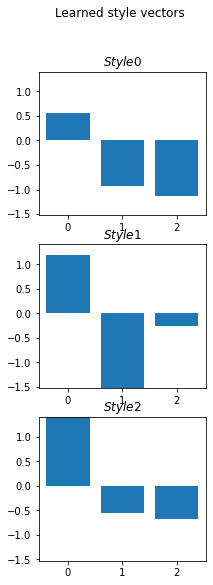

In [126]:
print(model_name)

#Plot style vectors
f, ax = plt.subplots(nrows=n_styles, 
                     ncols=1,
                     figsize=(3*1, 3*n_styles))
ax = ax.flatten()
f.suptitle('Learned style vectors') #style=person_id
ylim = (A.detach().numpy().min(), A.detach().numpy().max())
for s in range(n_styles):
    ax[s].bar(range(dim_style), A.detach().numpy()[:, s], label=f'Style {s}')
    ax[s].set_title(f'$Style {s}$')
    ax[s].set_ylim(ylim)
# f.tight_layout()
plt.show()        
        
# Save as figures
out_dir = Path(f'./results/{model_name}')
if not out_dir.exists():
    out_dir.mkdir(parents=True, exist_ok=True)

# Save A
out_fn = out_dir/'A.png'
if out_fn.exists():
    out_fn = out_dir/f'A_{now2str()}'
f.savefig(out_fn)

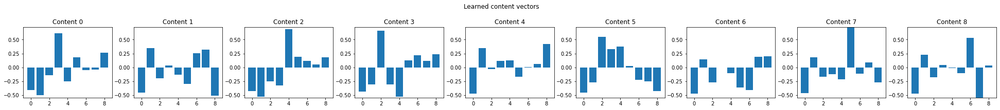

In [127]:
#Plot content vectors
f, ax = plt.subplots(nrows=1, 
                     ncols=n_contents,
                     figsize=(3*n_contents, 3*1))
ax = ax.flatten()
f.suptitle('Learned content vectors') #style=person_id
ylim = (B.detach().numpy().min(), B.detach().numpy().max())
for c in range(B.shape[-1]):
    ax[c].bar(range(B.shape[0]), B.detach().numpy()[:, c], label=f'Content {c}')
    ax[c].set_title(f'Content {c}')
    ax[c].set_ylim(ylim)
f.tight_layout()
plt.show()        

# Save as figures
out_dir = Path(f'./results/map/sym/sgd/{model_name}')
if not out_dir.exists():
    out_dir.mkdir(parents=True, exist_ok=True)

# Save B as figure 
out_fn = out_dir/'B.png'
if out_fn.exists():
    out_fn = out_dir/f'B_{now2str()}'
f.savefig(out_fn)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


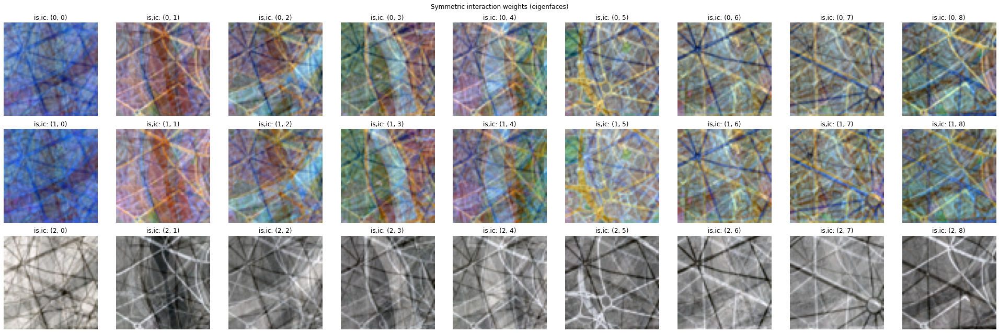

In [128]:
#Plot
f, ax = plt.subplots(nrows=dim_style, 
                     ncols=dim_content,
                     figsize=(3*dim_content,3*dim_style))
f.suptitle('Symmetric interaction weights (eigenfaces)') #style=person_id
for i in range(dim_style):
    for j in range(dim_content):
        basis = W[:,i,j].detach().numpy().reshape(TARGET_SIZE)
        ax[i,j].imshow(normalize_img(basis, vmin=0, vmax=1), cmap='gray')
        ax[i,j].set_title(f'is,ic: {i,j}')
        ax[i,j].set_axis_off()
f.tight_layout()
plt.show()        
        
# Save W as figure 
out_fn = out_dir/'W.png'
if out_fn.exists():
    out_fn = out_dir/f'W_{now2str()}'
f.savefig(out_fn)

In [129]:
def copy_as_np(t):
    return t.detach().numpy().copy()

In [130]:
# Reconstruct from symmetric model
def reconstruct_sym(A:np.ndarray, B:np.ndarray, W:np.ndarray) -> np.ndarray:
    """
    A (np.array): dim_style x n_styles sized matrix encoding the  style vectors
    B (np.array): a set of content vectors. Each column is a content vector. Size: dim_content x n_contents
    W (np.array): 3Dim matrix {w_{ijk}} of size (K=x_dim, dim_style, dim_content)
    
    Returns:
    - recons (np.array): 3dim matrix of size (K=x_dim, n_styles, n_contents)
    """
    dim_style, n_styles = A.shape
    dim_content, n_contents = B.shape
    x_dim, I, J = W.shape
    assert dim_style == I
    assert dim_content == J
    
    recons = np.zeros((x_dim, n_styles, n_contents))
    for s in range(n_styles):
        for c in range(n_contents):
            a = A[:,s].transpose()
            b = B[:,c].transpose()
            Wb = W@b[..., np.newaxis]
            assert Wb.ndim == 3 # Necessary for correct broadcasting for the subsequent `np.matmul`
            recons[:, s, c] = np.matmul(a,Wb).flatten()
            
    return recons

In [135]:
def plot_recons(recons: np.ndarray, reshape: Optional[Tuple[int,int]], title=None):
    """
    recons (np.ndarray): size (x_dim, n_styles, n_contents)
    reshape (None or Tupel of target image size)
    """
    _, n_styles, n_contents = recons.shape
    f, ax = plt.subplots(nrows=n_styles, ncols=n_contents,
                        figsize=(3*n_contents, 3*n_styles))
    if title is not None:
        f.suptitle(title)
    for s in range(n_styles):
        for c in range(n_contents):
            recon = normalize_img(recons[:,s,c])
            if reshape is not None:
                recon = recon.reshape(reshape)
            ax[s][c].imshow(recon, cmap='gray')
            ax[s][c].set_title(f'S,C: {s+1},{c+1}')
    return f

In [136]:
def compute_mse(x, recon):
    """
    
    """
    pass

In [137]:
recons = reconstruct_sym(copy_as_np(A), copy_as_np(B), copy_as_np(W))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


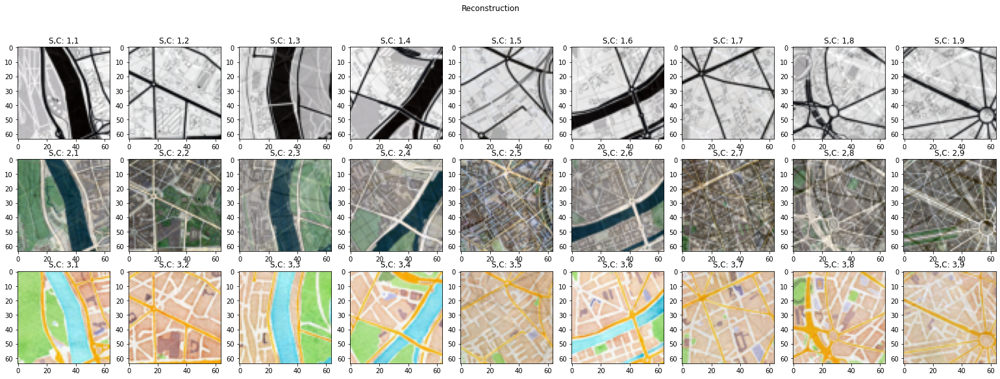

In [138]:
f_recon = plot_recons(recons, reshape=TARGET_SIZE, title='Reconstruction');

In [52]:
# Save W as figure 
out_fn = out_dir/'recon.png'
if out_fn.exists():
    out_fn = out_dir/f'recon_{now2str()}'
f_recon.savefig(out_fn)

### Save trained model

In [53]:
# sgd_model_dir = 
save_sgd_results(A,B,W, out_dir=model_dir)

Saved trained models to  trained/sym_sgd_img:64-ns:14-ds:12-nc:6-dc:6/11_02_16:28:02


(PosixPath('trained/sym_sgd_img:64-ns:14-ds:12-nc:6-dc:6'), '11_02_16:28:02')

------------------------------------------------------------------------

# Learn to generalize during test phase
We are interested in three kinds of generalization tasks:
- Classification
- Extrapolation
- Translation
In this section, we implement the learning algorithms for each type of tasks.  They share the same skeleton to the training time learning algorithm, with task-specific modifications in the training algorithm.
